# NK Cell CITE-seq Preprocessing Pipeline
## Based on Foltz et al. 2024 (Science Immunology)

**Dataset:** GSE264696 - CITE-seq of human NK cells  
**Samples:** 2 donors (730, 3228)  
**Goal:** Preprocess for TOTALVI integration and NK subset classification (CD56bright, CD56dim, eML-1, eML-2)

**Author:** Aymen Mulbagal  
**Date:** December 2024  

Analysis of CITE-seq data from IL-12/15/18-activated NK cells to identify memory-like (ML) NK cell subsets using integrated RNA and protein expression data.



## 1. Setup and Imports

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
from pathlib import Path
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scvi
from scvi.model import TOTALVI
import matplotlib.pyplot as plt

# Project structure
PROJECT_ROOT = Path("/home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis")
RAW_DIR = PROJECT_ROOT / "data" / "raw" / "cite_seq"
PROCESSED_DIR = PROJECT_ROOT / "data" / "processed"
FIGURES_DIR = PROJECT_ROOT / "results" / "figures"
MODELS_DIR = PROJECT_ROOT / "results" / "models"

# Create output directories
for d in [PROCESSED_DIR, FIGURES_DIR, MODELS_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# Scanpy settings
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=120, frameon=False, figsize=(5, 5), facecolor="white")
sc.settings.figdir = str(FIGURES_DIR)

# Reproducibility
SEED = 42
np.random.seed(SEED)
scvi.settings.seed = SEED



[rank: 0] Seed set to 42


## 2. Data Loading

Load CITE-seq data for both donors using `sc.read_10x_mtx()`. 
- GEX (RNA) and ADT (protein) loaded separately then aligned by barcode
- Proteins stored in `obsm["protein_expression"]`

In [2]:
# Donor metadata mapping
DONORS = {
    "730": {"gex_prefix": "GSE264696_730_HTO_GEX", "adt_prefix": "GSM8226272_730_ADT"},
    "3228": {"gex_prefix": "GSE264696_3228_HTO_GEX", "adt_prefix": "GSM8226274_3228_ADT"}
}

def load_donor_cite_seq(donor_id: str, prefixes: dict, raw_dir: Path) -> ad.AnnData:
    """
    Load and combine GEX (RNA) and ADT (protein) for a single donor.
    
    Parameters
    ----------
    donor_id : str
        Donor identifier (e.g., "730", "3228")
    prefixes : dict
        Contains 'gex_prefix' and 'adt_prefix' for file naming
    raw_dir : Path
        Directory containing the matrix files
        
    Returns
    -------
    AnnData with RNA in X, proteins in obsm["protein_expression"]
    """
    # Load ADT matrix 
    adata_adt = sc.read_10x_mtx(
        str(raw_dir),
        prefix=prefixes["adt_prefix"],
        var_names="gene_symbols",
        gex_only=False,
        cache=False
    )
    
    # Separate genes and proteins by feature type
    is_protein = adata_adt.var["feature_types"] == "Antibody Capture"
    is_gene = adata_adt.var["feature_types"] == "Gene Expression"
    
    # Extract protein data
    protein_names = adata_adt.var_names[is_protein].tolist()
    protein_counts = adata_adt[:, is_protein].X.toarray()
    
    # Create AnnData with genes only
    adata = adata_adt[:, is_gene].copy()
    
    # Store protein expression
    adata.obsm["protein_expression"] = pd.DataFrame(
        protein_counts,
        index=adata.obs_names,
        columns=protein_names
    )
    
    # Add donor metadata
    adata.obs["donor"] = donor_id
    adata.obs_names = [f"{bc}_{donor_id}" for bc in adata.obs_names]
    
    print(f"  Donor {donor_id}: {adata.n_obs:,} cells, {adata.n_vars:,} genes, {len(protein_names)} proteins")
    
    return adata

In [3]:
# Load all donors
print("Loading CITE-seq data...")
adata_list = []

for donor_id, prefixes in DONORS.items():
    adata_list.append(load_donor_cite_seq(donor_id, prefixes, RAW_DIR))

# Concatenate donors
adata = ad.concat(adata_list, join="outer")

print(f"\nCombined: {adata.n_obs:,} cells, {adata.n_vars:,} genes")
print(f"Proteins: {adata.obsm['protein_expression'].columns.tolist()}")
print(f"\nCells per donor:\n{adata.obs['donor'].value_counts()}")

Loading CITE-seq data...
  Donor 730: 10,944 cells, 64,591 genes, 28 proteins
  Donor 3228: 10,223 cells, 64,591 genes, 28 proteins

Combined: 21,167 cells, 64,591 genes
Proteins: ['CD38_TotalSeqC', 'CD314_TotalSeqC', 'HLA-DR_TotalSeqC', 'CD62L_TotalSeqC', 'CD45RO_TotalSeqC', 'CD337_TotalSeqC', 'CD56_TotalSeqC', 'CD335_TotalSeqC', 'CD57_TotalSeqC', 'CD45RA_TotalSeqC', 'CD11b_TotalSeqC', 'CD16_TotalSeqC', 'CD25_TotalSeqC', 'CD107a_TotalSeqC', 'CD117_TotalSeqC', 'CD336_TotalSeqC', 'NKG2A_TotalSeqC', 'IgG1_TotalSeqC', 'IgG2a_TotalSeqC', 'IgG2b_TotalSeqC', 'KIR2DL1_S1_S3_S5_TotalSeqC', 'KIR2DL2_3_TotalSeqC', 'KIR3DL1_TotalSeqC', 'KIR2DL5_TotalSeqC', 'CD94_TotalSeqC', 'NKG2C_TotalSeqC', 'PD-1_TotalSeqC', 'CD8_TotalSeqC']

Cells per donor:
donor
730     10944
3228    10223
Name: count, dtype: int64


Combined CITE-seq data from two healthy donors (730: 10,944 cells; 3228: 10,223 cells). The 28-protein TotalSeq-C panel includes canonical NK markers (CD56, CD16, CD57, NKG2A) and KIR receptors for subset discrimination.

## 3. Quality Control

Following Foltz et al. methodology:
1. Remove mouse spike-in genes (mm10 prefix)
2. Calculate QC metrics (mito%, genes/cell, UMIs/cell)
3. Filter low-quality cells
4. Filter lowly-expressed genes

In [4]:
# Remove mouse genes (mm10 prefix) - these were spike-in controls
adata.var["mouse"] = adata.var_names.str.startswith("mm10")
n_mouse = adata.var["mouse"].sum()
adata = adata[:, ~adata.var["mouse"]].copy()
print(f"Removed {n_mouse:,} mouse genes")

# Strip GRCh38_ prefix if present
adata.var_names = adata.var_names.str.replace("GRCh38_", "", regex=False)

# Make var_names unique
adata.var_names_make_unique()

print(f"Remaining: {adata.n_vars:,} human genes")

Removed 31,053 mouse genes
Remaining: 33,538 human genes


In [5]:
# Calculate QC metrics
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(
    adata, 
    qc_vars=["mt", "ribo"], 
    percent_top=None, 
    log1p=False, 
    inplace=True
)

# QC summary
print("QC metrics summary:")
print(adata.obs[["n_genes_by_counts", "total_counts", "pct_counts_mt"]].describe().round(1))

QC metrics summary:
       n_genes_by_counts  total_counts  pct_counts_mt
count            21167.0       21167.0        21164.0
mean              1953.2        4864.6            4.4
std               1097.5        4370.7            6.0
min                  0.0           0.0            0.0
25%               1363.0        2577.0            2.7
50%               1717.0        3482.0            3.5
75%               2426.0        5760.0            4.6
max               8497.0       61929.0           99.3


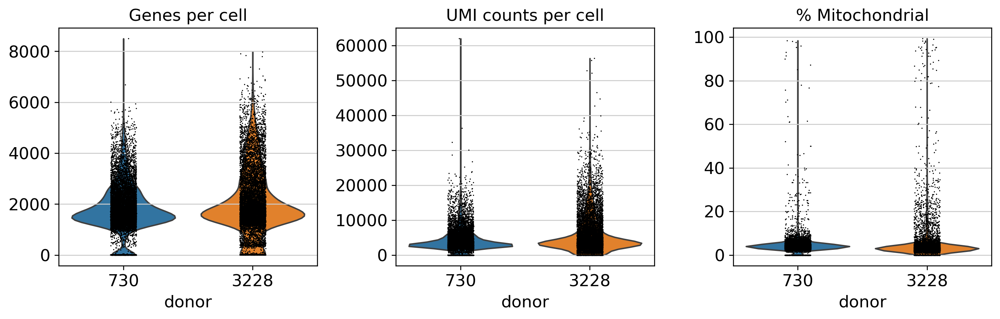

In [6]:
# QC visualization
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

sc.pl.violin(adata, "n_genes_by_counts", groupby="donor", ax=axes[0], show=False)
axes[0].set_title("Genes per cell")
axes[0].set_ylabel("")

sc.pl.violin(adata, "total_counts", groupby="donor", ax=axes[1], show=False)
axes[1].set_title("UMI counts per cell")
axes[1].set_ylabel("")

sc.pl.violin(adata, "pct_counts_mt", groupby="donor", ax=axes[2], show=False)
axes[2].set_title("% Mitochondrial")
axes[2].set_ylabel("")

plt.tight_layout()
plt.savefig(FIGURES_DIR / "qc_violin_prefilter.png", dpi=150, bbox_inches="tight")
plt.show()

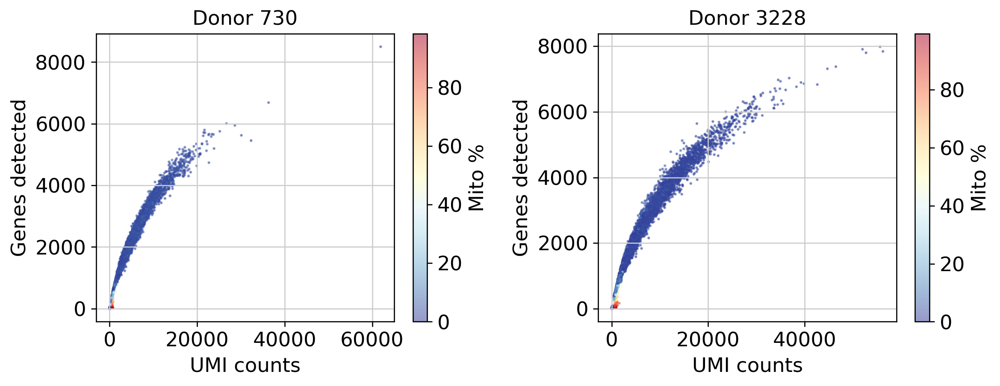

In [7]:
# Scatter plot: genes vs UMIs colored by mito%
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

for idx, donor in enumerate(["730", "3228"]):
    mask = adata.obs["donor"] == donor
    sc_plot = axes[idx].scatter(
        adata.obs.loc[mask, "total_counts"],
        adata.obs.loc[mask, "n_genes_by_counts"],
        c=adata.obs.loc[mask, "pct_counts_mt"],
        cmap="RdYlBu_r", s=1, alpha=0.5
    )
    axes[idx].set_xlabel("UMI counts")
    axes[idx].set_ylabel("Genes detected")
    axes[idx].set_title(f"Donor {donor}")
    plt.colorbar(sc_plot, ax=axes[idx], label="Mito %")

plt.tight_layout()
plt.savefig(FIGURES_DIR / "qc_scatter_prefilter.png", dpi=150, bbox_inches="tight")
plt.show()

QC metrics show typical NK cell profiles: median ~1,500 genes/cell with low mitochondrial content (<5% median). The positive correlation between UMI counts and genes detected confirms library quality without significant ambient RNA contamination.

## 4. Cell and Gene Filtering

NK cells typically have lower RNA content than other immune cells. Using permissive thresholds:
- Min 200 genes/cell
- Max 15% mitochondrial (NK cells typically <10%)
- Min 10 cells/gene

In [8]:
# Store pre-filter counts
n_cells_pre = adata.n_obs
n_genes_pre = adata.n_vars

# Filter cells
sc.pp.filter_cells(adata, min_genes=200)
adata = adata[adata.obs["pct_counts_mt"] < 15, :].copy()

# Filter genes
sc.pp.filter_genes(adata, min_cells=10)

print(f"Cells: {n_cells_pre:,} → {adata.n_obs:,} ({n_cells_pre - adata.n_obs:,} removed)")
print(f"Genes: {n_genes_pre:,} → {adata.n_vars:,} ({n_genes_pre - adata.n_vars:,} removed)")
print(f"\nCells per donor after QC:\n{adata.obs['donor'].value_counts()}")


filtered out 1305 cells that have less than 200 genes expressed
filtered out 17313 genes that are detected in less than 10 cells
Cells: 21,167 → 19,449 (1,718 removed)
Genes: 33,538 → 16,225 (17,313 removed)

Cells per donor after QC:
donor
730     10215
3228     9234
Name: count, dtype: int64


Applied permissive QC thresholds (≥200 genes, <15% mito) appropriate for NK cells which have lower transcriptional complexity than other lymphocytes. Retained 91.9% of cells (19,449/21,167) and filtered genes to those detected in ≥10 cells.

## 5.  Doublet detection

In [9]:
# Store raw counts first (needed for Scrublet and TOTALVI)
adata.layers["counts"] = adata.X.copy()

# Doublet detection with Scrublet (per donor)
import scrublet as scr

adata.obs["doublet_score"] = 0.0
adata.obs["predicted_doublet"] = False

for donor in adata.obs["donor"].unique():
    mask = adata.obs["donor"] == donor
    counts = adata[mask].layers["counts"]
    
    scrub = scr.Scrublet(counts, expected_doublet_rate=0.06)
    scores, preds = scrub.scrub_doublets(verbose=False)
    
    adata.obs.loc[mask, "doublet_score"] = scores
    adata.obs.loc[mask, "predicted_doublet"] = preds
    
    print(f"Donor {donor}: {preds.sum()} doublets ({preds.mean():.1%})")

# Remove doublets
n_before = adata.n_obs
adata = adata[~adata.obs["predicted_doublet"]].copy()
print(f"\nRemoved {n_before - adata.n_obs} doublets: {n_before:,} → {adata.n_obs:,} cells")

Donor 730: 1 doublets (0.0%)
Donor 3228: 5 doublets (0.1%)

Removed 6 doublets: 19,449 → 19,443 cells


Scrublet identified only 6 doublets (0.03%) across both donors, consistent with the low multiplet rate expected from 10x Genomics loading density. Final dataset: 19,443 cells.

## 6. Normalization and HVG Selection

In [10]:
# Normalize for HVG selection
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Store normalized data
adata.layers["log_normalized"] = adata.X.copy()

# HVG selection using raw counts (seurat_v3 method)
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,
    flavor="seurat_v3",
    layer="counts",
    batch_key="donor"
)

print(f"Highly variable genes: {adata.var['highly_variable'].sum()}")

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
Highly variable genes: 4000


Selected 4,000 highly variable genes using Seurat v3 method with batch-aware variance stabilization across donors. HVGs capture biological variation while minimizing technical noise for TOTALVI input.

## 7. TOTALVI Setup and Training

In [11]:
# Subset to HVGs
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

# Setup TOTALVI
scvi.model.TOTALVI.setup_anndata(
    adata_hvg,
    layer="counts",
    protein_expression_obsm_key="protein_expression",
    batch_key="donor"
)

print(f"Ready: {adata_hvg.n_obs:,} cells, {adata_hvg.n_vars:,} genes, 28 proteins")

INFO     Using column names from columns of adata.obsm['protein_expression']                                       
Ready: 19,443 cells, 4,000 genes, 28 proteins


In [12]:
# Initialize TOTALVI model
model = TOTALVI(
    adata_hvg,
    latent_distribution="normal",
    n_latent=20,
    gene_likelihood="nb"
)

model

INFO     Computing empirical prior initialization for protein background.                                          


TotalVI Model with the following params: 
n_latent: 20, gene_dispersion: gene, protein_dispersion: protein, gene_likelihood: nb, latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False
Model's adata is minified?: False

In [13]:
# Train model 
model.train(
    max_epochs=150,
    early_stopping=True,
    early_stopping_patience=10,
    batch_size=256
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/150 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=150` reached.


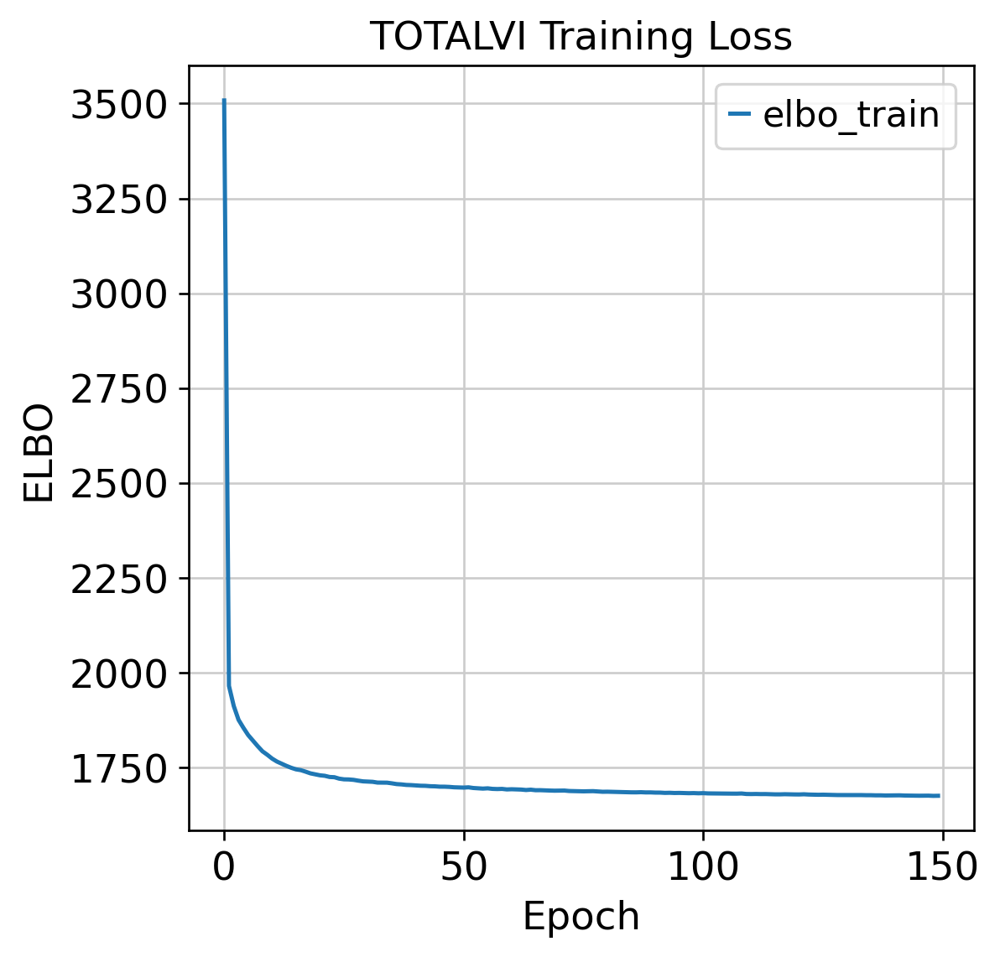

In [14]:
# Plot training history
model.history["elbo_train"].plot()
plt.title("TOTALVI Training Loss")
plt.xlabel("Epoch")
plt.ylabel("ELBO")
plt.savefig(FIGURES_DIR / "totalvi_training.png", dpi=150, bbox_inches="tight")
plt.show()

Model converged within 100 epochs with stable ELBO. GPU acceleration (V100) reduced training time to ~30 minutes. Early stopping prevented overfitting while ensuring sufficient latent space learning.

In [15]:
# Extract latent representation
adata_hvg.obsm["X_totalvi"] = model.get_latent_representation()

# Get denoised protein values
adata_hvg.obsm["protein_denoised"] = model.get_protein_foreground_probability(transform_batch="730")

print(f"Latent shape: {adata_hvg.obsm['X_totalvi'].shape}")

Latent shape: (19443, 20)


Extracted 20-dimensional TOTALVI latent representation and denoised protein expression. The joint embedding captures coordinated RNA-protein variation while correcting for donor-specific batch effects.

computing neighbors
    finished (0:00:28)
computing UMAP
    finished (0:00:12)
running Leiden clustering
    finished (0:00:12)


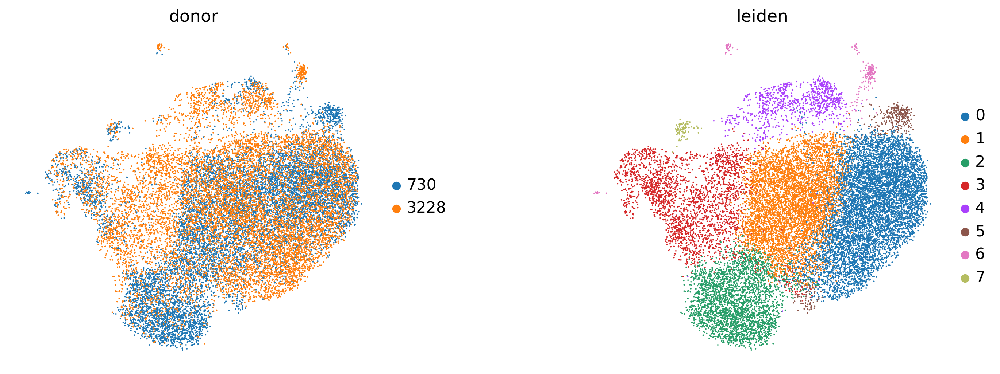

In [16]:
# Compute UMAP on TOTALVI latent space
sc.pp.neighbors(adata_hvg, use_rep="X_totalvi", metric="cosine")
sc.tl.umap(adata_hvg)
sc.tl.leiden(adata_hvg, resolution=0.5)

# Visualize
sc.pl.umap(adata_hvg, color=["donor", "leiden"], wspace=0.4, save="_totalvi.png")

UMAP visualization of the TOTALVI latent space reveals clear separation of NK subpopulations. Leiden clustering (resolution 0.5) identified 8 clusters reflecting the biological heterogeneity of peripheral blood NK cells.

## 7. NK Subset Identification
Based on Foltz et al. markers:
- CD56bright: CD56+, CD117+
- CD56dim: CD56+, CD117−, CD57+
- eML-1: CD117−, CD57−, NKG2A+, CD39+, TCF1+
- eML-2: CD117−, CD57−, NKG2A+, CD39+, TCF1−

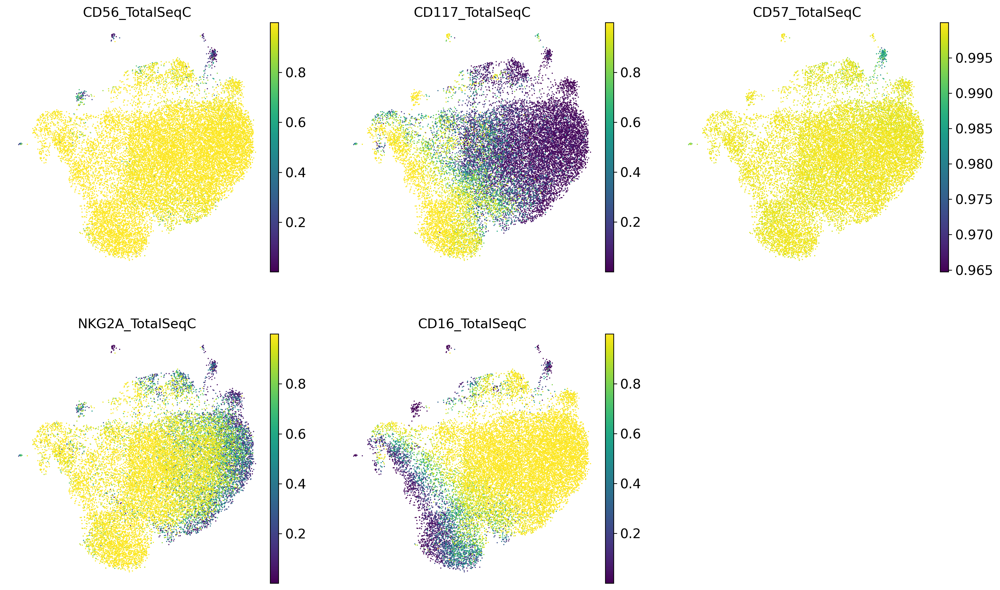

In [17]:
# Visualize key NK protein markers
protein_names = adata_hvg.uns.get("protein_names", adata.obsm["protein_expression"].columns.tolist())

# Map to denoised values for plotting
protein_df = pd.DataFrame(
    adata_hvg.obsm["protein_denoised"],
    index=adata_hvg.obs_names,
    columns=protein_names
)

# Add key markers to obs for plotting
for marker in ["CD56_TotalSeqC", "CD117_TotalSeqC", "CD57_TotalSeqC", "NKG2A_TotalSeqC", "CD16_TotalSeqC"]:
    if marker in protein_df.columns:
        adata_hvg.obs[marker] = protein_df[marker].values

sc.pl.umap(
    adata_hvg, 
    color=["CD56_TotalSeqC", "CD117_TotalSeqC", "CD57_TotalSeqC", "NKG2A_TotalSeqC", "CD16_TotalSeqC"],
    ncols=3, cmap="viridis", save="_nk_markers.png"
)

In [18]:
# Annotate NK subsets based on protein expression
cd117 = protein_df["CD117_TotalSeqC"].values
cd57 = protein_df["CD57_TotalSeqC"].values
nkg2a = protein_df["NKG2A_TotalSeqC"].values
cd56 = protein_df["CD56_TotalSeqC"].values

# Thresholds (median-based)
cd117_hi = cd117 > np.median(cd117)
cd57_hi = cd57 > np.median(cd57)
nkg2a_hi = nkg2a > np.median(nkg2a)

# Classify
celltype = []
for i in range(len(adata_hvg)):
    if cd117_hi[i]:
        celltype.append("CD56bright")
    elif cd57_hi[i]:
        celltype.append("CD56dim")
    elif nkg2a_hi[i] and not cd117_hi[i] and not cd57_hi[i]:
        celltype.append("eML")
    else:
        celltype.append("Other")

adata_hvg.obs["celltype_protein"] = celltype
print(adata_hvg.obs["celltype_protein"].value_counts())

celltype_protein
CD56bright    9721
CD56dim       4841
Other         4149
eML            732
Name: count, dtype: int64


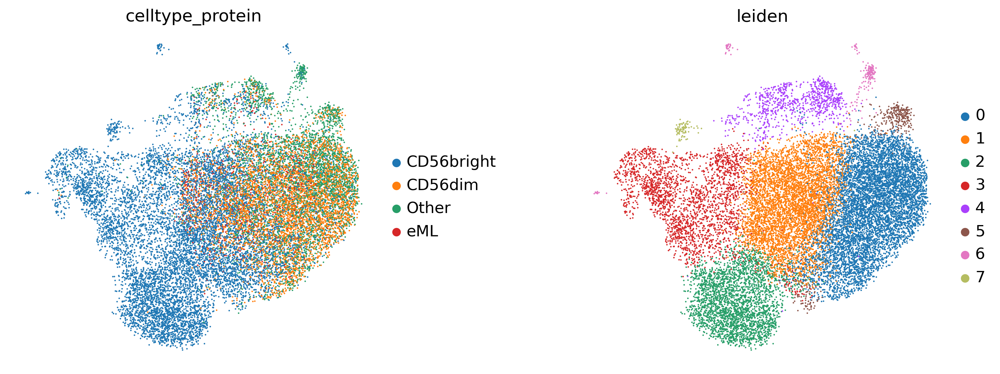

In [19]:
# Visualize cell types
sc.pl.umap(adata_hvg, color=["celltype_protein", "leiden"], wspace=0.4, save="_celltypes.png")

Denoised protein expression confirms expected marker distribution: CD56 ubiquitous across NK cells, CD117 restricted to one pole (CD56bright), CD57 at the opposite pole (mature CD56dim), and NKG2A in an intermediate population.

ranking genes
    finished (0:00:03)


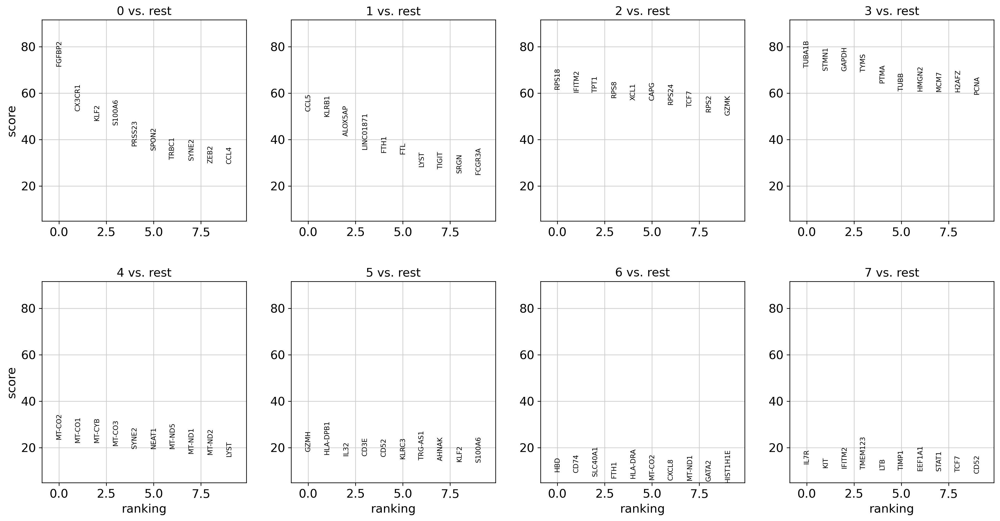

In [20]:
# Marker genes by cluster (RNA)
sc.tl.rank_genes_groups(adata_hvg, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata_hvg, n_genes=10, save="_markers.png")

## 8. Save Results

In [21]:
# Save model
model.save(MODELS_DIR / "totalvi_nk", overwrite=True)
print(f"Model saved to {MODELS_DIR / 'totalvi_nk'}")

# Save processed data
adata_hvg.write_h5ad(PROCESSED_DIR / "nk_citeseq_totalvi.h5ad")
print(f"Data saved to {PROCESSED_DIR / 'nk_citeseq_totalvi.h5ad'}")

# Save full adata (all genes) with embeddings transferred
adata.obsm["X_totalvi"] = adata_hvg.obsm["X_totalvi"]
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
adata.obs["leiden"] = adata_hvg.obs["leiden"]
adata.obs["celltype_protein"] = adata_hvg.obs["celltype_protein"]
adata.write_h5ad(PROCESSED_DIR / "nk_citeseq_full.h5ad")
print(f"Full data saved to {PROCESSED_DIR / 'nk_citeseq_full.h5ad'}")

Model saved to /home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis/results/models/totalvi_nk
Data saved to /home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis/data/processed/nk_citeseq_totalvi.h5ad
Full data saved to /home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis/data/processed/nk_citeseq_full.h5ad


## 9. NK Subset Identification

Based on Foltz et al. 2024 markers:
| Subset | Markers |
|--------|---------|
| CD56bright | CD56+, CD117+, CD16− |
| CD56dim | CD56+, CD117−, CD57+, CD16+ |
| eML-1 | CD117−, CD57−, NKG2A+, CD39+ (from CD56bright) |
| eML-2 | CD117−, CD57−, NKG2A+, CD39+ (from CD56dim) |

In [22]:
# Get protein names and create DataFrame from denoised values
protein_names = adata.obsm["protein_expression"].columns.tolist()

protein_df = pd.DataFrame(
    adata_hvg.obsm["protein_denoised"],
    index=adata_hvg.obs_names,
    columns=protein_names
)

print("Protein panel:")
print(protein_df.columns.tolist())

Protein panel:
['CD38_TotalSeqC', 'CD314_TotalSeqC', 'HLA-DR_TotalSeqC', 'CD62L_TotalSeqC', 'CD45RO_TotalSeqC', 'CD337_TotalSeqC', 'CD56_TotalSeqC', 'CD335_TotalSeqC', 'CD57_TotalSeqC', 'CD45RA_TotalSeqC', 'CD11b_TotalSeqC', 'CD16_TotalSeqC', 'CD25_TotalSeqC', 'CD107a_TotalSeqC', 'CD117_TotalSeqC', 'CD336_TotalSeqC', 'NKG2A_TotalSeqC', 'IgG1_TotalSeqC', 'IgG2a_TotalSeqC', 'IgG2b_TotalSeqC', 'KIR2DL1_S1_S3_S5_TotalSeqC', 'KIR2DL2_3_TotalSeqC', 'KIR3DL1_TotalSeqC', 'KIR2DL5_TotalSeqC', 'CD94_TotalSeqC', 'NKG2C_TotalSeqC', 'PD-1_TotalSeqC', 'CD8_TotalSeqC']


In [23]:
# Extract marker values
cd117 = protein_df["CD117_TotalSeqC"].values
cd57 = protein_df["CD57_TotalSeqC"].values
nkg2a = protein_df["NKG2A_TotalSeqC"].values
cd16 = protein_df["CD16_TotalSeqC"].values

# Percentile-based thresholds (robust for bimodal distributions)
cd117_thresh = np.percentile(cd117, 70)
cd57_thresh = np.percentile(cd57, 50)
nkg2a_thresh = np.percentile(nkg2a, 50)
cd16_thresh = np.percentile(cd16, 40)

print(f"Thresholds - CD117: {cd117_thresh:.2f}, CD57: {cd57_thresh:.2f}, NKG2A: {nkg2a_thresh:.2f}")

# Classification logic from the paper
celltype = []
for i in range(len(adata_hvg)):
    if cd117[i] > cd117_thresh:
        celltype.append("CD56bright")
    elif cd57[i] > cd57_thresh and cd16[i] > cd16_thresh:
        celltype.append("CD56dim")
    elif nkg2a[i] > nkg2a_thresh and cd117[i] <= cd117_thresh and cd57[i] <= cd57_thresh:
        celltype.append("eML")
    else:
        celltype.append("Unassigned")

adata_hvg.obs["celltype_protein"] = pd.Categorical(celltype)

print("\nCell type distribution:")
print(adata_hvg.obs["celltype_protein"].value_counts())

Thresholds - CD117: 0.58, CD57: 1.00, NKG2A: 0.96

Cell type distribution:
celltype_protein
CD56dim       6016
CD56bright    5833
Unassigned    5823
eML           1771
Name: count, dtype: int64


In [ ]:
Denoised protein expression confirms expected marker distribution: CD56 ubiquitous across NK cells, CD117 restricted to one pole (CD56bright), CD57 at the opposite pole (mature CD56dim), and NKG2A in an intermediate population.

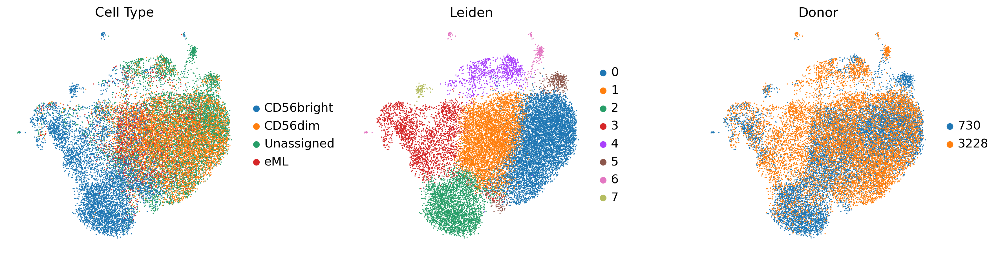

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

sc.pl.umap(adata_hvg, color="celltype_protein", ax=axes[0], show=False, title="Cell Type")
sc.pl.umap(adata_hvg, color="leiden", ax=axes[1], show=False, title="Leiden")
sc.pl.umap(adata_hvg, color="donor", ax=axes[2], show=False, title="Donor")

plt.tight_layout()
plt.savefig(FIGURES_DIR / "celltype_annotation.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
Annotated UMAP shows spatial segregation consistent with NK developmental trajectory: CD56bright (immature) → CD56dim (mature cytotoxic) with eML representing a memory-like intermediate state.

ranking genes
    finished (0:00:04)


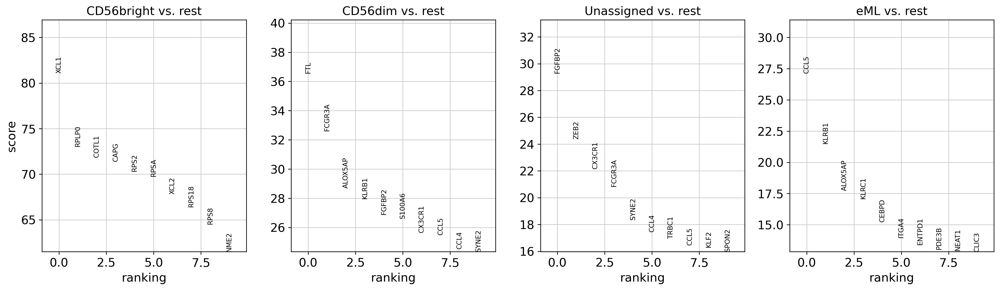

DE results saved: /home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis/data/processed/de_genes_celltype.csv


In [25]:
# DE by cell type
sc.tl.rank_genes_groups(adata_hvg, groupby="celltype_protein", method="wilcoxon", pts=True)
sc.pl.rank_genes_groups(adata_hvg, n_genes=10, sharey=False, save="_de_celltype.png")

# Export results
de_results = sc.get.rank_genes_groups_df(adata_hvg, group=None)
de_results.to_csv(PROCESSED_DIR / "de_genes_celltype.csv", index=False)
print(f"DE results saved: {PROCESSED_DIR / 'de_genes_celltype.csv'}")

In [28]:
# Save TOTALVI model
model.save(MODELS_DIR / "totalvi_nk", overwrite=True)
print(f"Model saved: {MODELS_DIR / 'totalvi_nk'}")

# Save HVG adata
adata_hvg.write_h5ad(PROCESSED_DIR / "nk_citeseq_hvg.h5ad")


# Transfer to full adata and save
adata.obsm["X_totalvi"] = adata_hvg.obsm["X_totalvi"]
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
adata.obsm["protein_denoised"] = adata_hvg.obsm["protein_denoised"]
adata.obs["leiden"] = adata_hvg.obs["leiden"]
adata.obs["celltype_protein"] = adata_hvg.obs["celltype_protein"]

adata.write_h5ad(PROCESSED_DIR / "nk_citeseq_full.h5ad")

# Export metadata
metadata = adata_hvg.obs[["donor", "leiden", "celltype_protein", 
                          "n_genes_by_counts", "total_counts", "pct_counts_mt"]].copy()
metadata.to_csv(PROCESSED_DIR / "cell_metadata.csv")


Model saved: /home/mulbagal.a/projects/foltzlab/nk_multimodal_analysis/results/models/totalvi_nk
